# Proyek Analisis Data: [E-commerce-public-dataset]
- **Nama:** [Dudi Nurdiyansah]
- **Email:** [m271b4ky1187@bangkit.academy]
- **ID Dicoding:** [dudi_nurdiyansah_usFA]

## Menentukan Pertanyaan Bisnis

- Pertanyaan 1: Kategori produk mana yang mendorong penjualan terbanyak?
- Pertanyaan 2: Bagaimana tren penjualan untuk kategori produk dengan penjualan terbanyak?
- Pertanyaan 3: Kategori produk mana yang mendapatkan penjualan terendah?
- Pertanyaan 4: Bagaimana rata-rata tren penjualan produk secara keseluruhan?
- Pertanyaan 5: Jenis pembayaran mana yang paling dominan digunakan oleh customers?
- Pertanyaan 6: Apa status pesanan yang paling umum dan bagaimana distribusi status pesanan tersebut?
- Pertanyaan 7: Kota mana yang memiliki kontribusi terbesar terhadap jumlah pelanggan, dan bagaimana strategi pemasaran dapat disesuaikan untuk meningkatkan pangsa pasar di kota-kota lainnya?
- Pertanyaan 8: Apa kategori produk dengan rating ulasan tertinggi dan terendah?
- Pertanyaan 9: Apakah ada korelasi antara nilai review ulasan dan biaya pengiriman?
- Pertanyaan 10 : Di kota mana konsentrasi seller paling tinggi?

## Import Semua Packages/Library yang Digunakan

In [289]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import streamlit as st

In [290]:
st.title("Proyek Analisis Data")

2024-10-04 02:27:02.109 
  command:

    streamlit run C:\Users\hp\anaconda3\lib\site-packages\ipykernel_launcher.py [ARGUMENTS]


DeltaGenerator()

## Data Wrangling

### Gathering Data

#### Data Customers

In [219]:
data_customers = pd.read_csv('customers_dataset.csv')
data_customers.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


#### Data Geolocations

In [220]:
data_geolocations = pd.read_csv('geolocation_dataset.csv')
data_geolocations.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


#### Data Order Items

In [221]:
data_order_items = pd.read_csv('order_items_dataset.csv')
data_order_items.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


#### Data Order Payments

In [222]:
data_order_payments = pd.read_csv('order_payments_dataset.csv')
data_order_payments.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


#### Data Order Reviews

In [223]:
data_order_reviews = pd.read_csv('order_reviews_dataset.csv')
data_order_reviews.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


#### Data Orders

In [224]:
data_orders = pd.read_csv('orders_dataset.csv')
data_orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


#### Data Product Category

In [225]:
data_product_category_name_translation = pd.read_csv('product_category_name_translation.csv')
data_product_category_name_translation.head()

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor


#### Data Products

In [226]:
data_products = pd.read_csv('products_dataset.csv')
data_products.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


#### Data Sellers

In [227]:
data_sellers = pd.read_csv('sellers_dataset.csv')
data_sellers.head()

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


**Insight:**
- Terdapat 9 dataset yaitu : Data Customers, Data Geolocations, Data Order Items, Data Payments, Data Order Reviews, Data Orders, Data Product Category Name Translation, Data Products, dan Data Sellers
- Pada data-data tersebut terdapat atribut yang memiliki hubungan satu sama lain yang nanti akan dilakukan join pada saat EDA.

**English:**

- There are 9 datasets: Data Customers, Data Geolocations, Data Order Items, Data Payments, Data Order Reviews, Data Orders, Data Product Category Name Translation, Data Products, and Data Sellers.
- In these datasets, there are attributes that are related to each other, which will later be joined during the EDA (Exploratory Data Analysis).

### Assessing Data

In [228]:
data_customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


In [229]:
data_customers.describe()

,customer_zip_code_prefix
count,99441.000000
mean,35137.474583
std,29797.938996
min,1003.000000
25%,11347.000000
50%,24416.000000
75%,58900.000000
max,99990.000000


In [230]:
data_customers.isnull().sum()

customer_id                 0
customer_unique_id          0
customer_zip_code_prefix    0
customer_city               0
customer_state              0
dtype: int64

In [231]:
data_geolocations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000163 entries, 0 to 1000162
Data columns (total 5 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   geolocation_zip_code_prefix  1000163 non-null  int64  
 1   geolocation_lat              1000163 non-null  float64
 2   geolocation_lng              1000163 non-null  float64
 3   geolocation_city             1000163 non-null  object 
 4   geolocation_state            1000163 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 38.2+ MB


In [232]:
data_geolocations.describe()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng
count,1.000163e+06,1.000163e+06,1.000163e+06
mean,3.657417e+04,-2.117615e+01,-4.639054e+01
std,3.054934e+04,5.715866e+00,4.269748e+00
min,1.001000e+03,-3.660537e+01,-1.014668e+02
25%,1.107500e+04,-2.360355e+01,-4.857317e+01
50%,2.653000e+04,-2.291938e+01,-4.663788e+01
75%,6.350400e+04,-1.997962e+01,-4.376771e+01
max,9.999000e+04,4.506593e+01,1.211054e+02


In [233]:
data_geolocations.isnull().sum()

geolocation_zip_code_prefix    0
geolocation_lat                0
geolocation_lng                0
geolocation_city               0
geolocation_state              0
dtype: int64

In [234]:
data_order_items.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


In [235]:
data_order_items.describe()

,order_item_id,price,freight_value
count,112650.000000,112650.000000,112650.000000
mean,1.197834,120.653739,19.990320
std,0.705124,183.633928,15.806405
min,1.000000,0.850000,0.000000
25%,1.000000,39.900000,13.080000
50%,1.000000,74.990000,16.260000
75%,1.000000,134.900000,21.150000
max,21.000000,6735.000000,409.680000


In [236]:
data_order_items.isnull().sum()

order_id               0
order_item_id          0
product_id             0
seller_id              0
shipping_limit_date    0
price                  0
freight_value          0
dtype: int64

In [237]:
data_order_payments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  
 4   payment_value         103886 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.0+ MB


In [238]:
data_order_payments.describe()

,payment_sequential,payment_installments,payment_value
count,103886.000000,103886.000000,103886.000000
mean,1.092679,2.853349,154.100380
std,0.706584,2.687051,217.494064
min,1.000000,0.000000,0.000000
25%,1.000000,1.000000,56.790000
50%,1.000000,1.000000,100.000000
75%,1.000000,4.000000,171.837500
max,29.000000,24.000000,13664.080000


In [239]:
data_order_payments.isnull().sum()

order_id                0
payment_sequential      0
payment_type            0
payment_installments    0
payment_value           0
dtype: int64

In [240]:
data_order_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   review_id                99224 non-null  object
 1   order_id                 99224 non-null  object
 2   review_score             99224 non-null  int64 
 3   review_comment_title     11568 non-null  object
 4   review_comment_message   40977 non-null  object
 5   review_creation_date     99224 non-null  object
 6   review_answer_timestamp  99224 non-null  object
dtypes: int64(1), object(6)
memory usage: 5.3+ MB


In [241]:
data_order_reviews.describe()

,review_score
count,99224.000000
mean,4.086421
std,1.347579
min,1.000000
25%,4.000000
50%,5.000000
75%,5.000000
max,5.000000


In [242]:
data_order_reviews.isnull().sum()

review_id                      0
order_id                       0
review_score                   0
review_comment_title       87656
review_comment_message     58247
review_creation_date           0
review_answer_timestamp        0
dtype: int64

In [243]:
data_orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB


In [244]:
data_orders.isnull().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

In [245]:
data_orders.describe()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
count,99441,99441,99441,99441,99281,97658,96476,99441
unique,99441,99441,8,98875,90733,81018,95664,459
top,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2018-04-11 10:48:14,2018-02-27 04:31:10,2018-05-09 15:48:00,2018-05-08 23:38:46,2017-12-20 00:00:00
freq,1,1,96478,3,9,47,3,522


In [246]:
data_products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_id                  32951 non-null  object 
 1   product_category_name       32341 non-null  object 
 2   product_name_lenght         32341 non-null  float64
 3   product_description_lenght  32341 non-null  float64
 4   product_photos_qty          32341 non-null  float64
 5   product_weight_g            32949 non-null  float64
 6   product_length_cm           32949 non-null  float64
 7   product_height_cm           32949 non-null  float64
 8   product_width_cm            32949 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.3+ MB


In [247]:
data_products.describe()

,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
count,32341.000000,32341.000000,32341.000000,32949.000000,32949.000000,32949.000000,32949.000000
mean,48.476949,771.495285,2.188986,2276.472488,30.815078,16.937661,23.196728
std,10.245741,635.115225,1.736766,4282.038731,16.914458,13.637554,12.079047
min,5.000000,4.000000,1.000000,0.000000,7.000000,2.000000,6.000000
25%,42.000000,339.000000,1.000000,300.000000,18.000000,8.000000,15.000000
50%,51.000000,595.000000,1.000000,700.000000,25.000000,13.000000,20.000000
75%,57.000000,972.000000,3.000000,1900.000000,38.000000,21.000000,30.000000
max,76.000000,3992.000000,20.000000,40425.000000,105.000000,105.000000,118.000000


In [248]:
data_products.isnull().sum()

product_id                      0
product_category_name         610
product_name_lenght           610
product_description_lenght    610
product_photos_qty            610
product_weight_g                2
product_length_cm               2
product_height_cm               2
product_width_cm                2
dtype: int64

In [249]:
data_product_category_name_translation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71 entries, 0 to 70
Data columns (total 2 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   product_category_name          71 non-null     object
 1   product_category_name_english  71 non-null     object
dtypes: object(2)
memory usage: 1.2+ KB


In [250]:
data_product_category_name_translation.describe()

,product_category_name,product_category_name_english
count,71,71
unique,71,71
top,beleza_saude,health_beauty
freq,1,1


In [251]:
data_product_category_name_translation.isnull().sum()

product_category_name            0
product_category_name_english    0
dtype: int64

In [252]:
data_sellers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3095 entries, 0 to 3094
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   seller_id               3095 non-null   object
 1   seller_zip_code_prefix  3095 non-null   int64 
 2   seller_city             3095 non-null   object
 3   seller_state            3095 non-null   object
dtypes: int64(1), object(3)
memory usage: 96.8+ KB


In [253]:
data_sellers.describe()

,seller_zip_code_prefix
count,3095.000000
mean,32291.059451
std,32713.453830
min,1001.000000
25%,7093.500000
50%,14940.000000
75%,64552.500000
max,99730.000000


In [254]:
data_sellers.isnull().sum()

seller_id                 0
seller_zip_code_prefix    0
seller_city               0
seller_state              0
dtype: int64

**Insight:**
- Pada Data Order Reviews, terdapat atribut review_comment_title sebanyak 87656 memiliki value null dan review_comment_message sebanyak 58247 value null sehingga diperlukan penyesuaian pada saat Cleaning Data.
- Pada Data Orders, terdapat atribut order_approved_at sebanyak 160 memiliki value null, order_delivered_carrier_date sebanyak 1783, dan order_delivered_customer_date sebanyak 2965.
- Data product pada atribut product_category_name sebanyak 610 memiliki value null, product_name_lenght sebanyak 610, product_description_lenght sebanyak 610, dan product_photos_qty   sebanyak 610 value.

**English:**
- In the Data Order Reviews, there are attributes: review_comment_title with 87,656 null values and review_comment_message with 58,247 null values, requiring adjustments during the data cleaning process.
- In the Data Orders, there are attributes: order_approved_at with 160 null values, order_delivered_carrier_date with 1,783 null values, and order_delivered_customer_date with 2,965 null values.
- In the Data Products, the attributes have null values as follows: product_category_name with 610 null values, product_name_length with 610 null values, product_description_length with 610 null values, and product_photos_qty with 610 null values.

### Cleaning Data

In [255]:
# Mengganti nilai null dengan "tidak mencantumkan"
data_order_reviews['review_comment_title'] = data_order_reviews['review_comment_title'].fillna('tidak mencantumkan')
data_order_reviews['review_comment_message'] = data_order_reviews['review_comment_message'].fillna('tidak mencantumkan')

# Memeriksa kembali jumlah nilai null setelah penggantian
print(data_order_reviews.isnull().sum())


review_id                  0
order_id                   0
review_score               0
review_comment_title       0
review_comment_message     0
review_creation_date       0
review_answer_timestamp    0
dtype: int64


In [256]:
# Mengganti nilai null dengan "data tidak tersedia"
data_orders['order_approved_at'] = data_orders['order_approved_at'].fillna('data tidak tersedia')
data_orders['order_delivered_carrier_date'] = data_orders['order_delivered_carrier_date'].fillna('data tidak tersedia')
data_orders['order_delivered_customer_date'] = data_orders['order_delivered_customer_date'].fillna('data tidak tersedia')

# Memeriksa kembali jumlah nilai null setelah penggantian
print(data_orders.isnull().sum())


order_id                         0
customer_id                      0
order_status                     0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
dtype: int64


In [257]:
# Mengganti nilai null dengan "tidak ada data"
data_products['product_category_name'] = data_products['product_category_name'].fillna('tidak ada data')
data_products['product_name_lenght'] = data_products['product_name_lenght'].fillna('tidak ada data')
data_products['product_description_lenght'] = data_products['product_description_lenght'].fillna('tidak ada data')
data_products['product_photos_qty'] = data_products['product_photos_qty'].fillna('tidak ada data')
data_products['product_weight_g'] = data_products['product_weight_g'].fillna('tidak ada data')
data_products['product_length_cm'] = data_products['product_length_cm'].fillna('tidak ada data')
data_products['product_height_cm'] = data_products['product_height_cm'].fillna('tidak ada data')
data_products['product_width_cm'] = data_products['product_width_cm'].fillna('tidak ada data')

# Memeriksa kembali jumlah nilai null setelah penggantian
print(data_products.isnull().sum())


product_id                    0
product_category_name         0
product_name_lenght           0
product_description_lenght    0
product_photos_qty            0
product_weight_g              0
product_length_cm             0
product_height_cm             0
product_width_cm              0
dtype: int64


**Insight:**
- Kolom review_comment_title dan review_comment_message pada Data Order Reviews diisi dengan nilai "tidak mencantumkan" pada value yang null.
- Kolom order_approved_at, order_delivered_carrier_date, dan order_delivered_customer_date pada Data Orders diisi dengan nilai "data tidak tersedia" pada value yang null.
- Kolom pada Data Products, yaitu product_category_name, product_name_lenght, product_description_lenght, product_photos_qty, product_weight_g, product_length_cm, product_height_cm, dan product_width_cm diisi dengan nilai "tidak ada data" pada value yang null.

**English:**

- The columns review_comment_title and review_comment_message in the Data Order Reviews are filled with the value "tidak mencantumkan" for null values.
- The columns order_approved_at, order_delivered_carrier_date, and order_delivered_customer_date in the Data Orders are filled with the value "data tidak tersedia" for null values.
- In the Data Products, the columns product_category_name, product_name_length, product_description_length, product_photos_qty, product_weight_g, product_length_cm, product_height_cm, and product_width_cm are filled with the value "tidak ada data" for null values.

## Exploratory Data Analysis (EDA)

### Langkah EDA dibawah ini dilakukan untuk mengetahui apakah untuk setiap dataset memiliki hubungan satu dengan yang lainnya.

### Following EDA steps are conducted to determine whether each dataset has relationships with one another.

#### Join Data Customers to Oders

In [258]:
customers_orders = pd.merge(data_customers, data_orders, on="customer_id")
customers_orders.head()


,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,2017-05-25 10:35:35,2017-06-05 00:00:00
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,29150127e6685892b6eab3eec79f59c7,delivered,2018-01-12 20:48:24,2018-01-12 20:58:32,2018-01-15 17:14:59,2018-01-29 12:41:19,2018-02-06 00:00:00
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,b2059ed67ce144a36e2aa97d2c9e9ad2,delivered,2018-05-19 16:07:45,2018-05-20 16:19:10,2018-06-11 14:31:00,2018-06-14 17:58:51,2018-06-13 00:00:00
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,951670f92359f4fe4a63112aa7306eba,delivered,2018-03-13 16:06:38,2018-03-13 17:29:19,2018-03-27 23:22:42,2018-03-28 16:04:25,2018-04-10 00:00:00
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,6b7d50bd145f6fc7f33cebabd7e49d0f,delivered,2018-07-29 09:51:30,2018-07-29 10:10:09,2018-07-30 15:16:00,2018-08-09 20:55:48,2018-08-15 00:00:00


- Key: customer_id

- Tujuan: Menyambungkan informasi customer dengan order yang dilakukan.

#### Join Data Order to Oders Item

In [259]:
orders_items = pd.merge(data_orders, data_order_items, on="order_id")
orders_items.head()


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,1,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-30 03:24:27,118.70,22.76
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,1,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,2018-08-13 08:55:23,159.90,19.22
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,1,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,2017-11-23 19:45:59,45.00,27.20
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,1,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,2018-02-19 20:31:37,19.90,8.72


- Key: order_id

- Tujuan: Menyambungkan detail order dengan item yang dibeli dalam order tersebut.

#### Join Data Order Payment to Order Dataset

In [260]:
orders_payments = pd.merge(data_order_payments, data_orders, on="order_id")
orders_payments.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33,0a8556ac6be836b46b3e89920d59291c,delivered,2018-04-25 22:01:49,2018-04-25 22:15:09,2018-05-02 15:20:00,2018-05-09 17:36:51,2018-05-22 00:00:00
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39,f2c7fc58a9de810828715166c672f10a,delivered,2018-06-26 11:01:38,2018-06-26 11:18:58,2018-06-28 14:18:00,2018-06-29 20:32:09,2018-07-16 00:00:00
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71,25b14b69de0b6e184ae6fe2755e478f9,delivered,2017-12-12 11:19:55,2017-12-14 09:52:34,2017-12-15 20:13:22,2017-12-18 17:24:41,2018-01-04 00:00:00
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78,7a5d8efaaa1081f800628c30d2b0728f,delivered,2017-12-06 12:04:06,2017-12-06 12:13:20,2017-12-07 20:28:28,2017-12-21 01:35:51,2018-01-04 00:00:00
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45,15fd6fb8f8312dbb4674e4518d6fa3b3,delivered,2018-05-21 13:59:17,2018-05-21 16:14:41,2018-05-22 11:46:00,2018-06-01 21:44:53,2018-06-13 00:00:00


- Key: order_id

- Tujuan: Menghubungkan order dengan detail pembayaran yang dilakukan untuk order tersebut.

#### Join Data Customers to Order Geolocation

In [261]:
customers_geolocations = pd.merge(data_customers, data_geolocations, left_on="customer_zip_code_prefix", right_on="geolocation_zip_code_prefix")
customers_geolocations.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,14409,-20.509897,-47.397866,franca,SP
1,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,14409,-20.497396,-47.399241,franca,SP
2,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,14409,-20.510459,-47.399553,franca,SP
3,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,14409,-20.480940,-47.394161,franca,SP
4,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,14409,-20.515413,-47.398194,franca,SP


- Key: customer_zip_code_prefix = geolocation_zip_code_prefix

- Tujuan: Menghubungkan customer dengan informasi geolokasi (latitude dan longitude).

#### Join Data Sellers to Order Geolocation

In [262]:
sellers_geolocations = pd.merge(data_sellers, data_geolocations, left_on="seller_zip_code_prefix", right_on="geolocation_zip_code_prefix")
sellers_geolocations.head()

,seller_id,seller_zip_code_prefix,seller_city,seller_state,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP,13023,-22.898536,-47.063125,campinas,SP
1,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP,13023,-22.895499,-47.061944,campinas,SP
2,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP,13023,-22.891740,-47.060820,campinas,SP
3,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP,13023,-22.895762,-47.066144,campinas,SP
4,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP,13023,-22.896154,-47.062431,campinas,SP


- Key: seller_zip_code_prefix = geolocation_zip_code_prefix

- Tujuan: Menghubungkan seller dengan informasi geolokasi.

#### Mengetahui Waktu pengiriman

In [264]:
print(data_orders['order_delivered_customer_date'].unique())
print(data_orders['order_delivered_carrier_date'].unique())

['2017-10-10 21:25:13' '2018-08-07 15:27:45' '2018-08-17 18:06:29' ...
 '2017-09-21 11:24:17' '2018-01-25 23:32:54' '2018-03-16 13:08:30']
['2017-10-04 19:55:00' '2018-07-26 14:31:00' '2018-08-08 13:50:00' ...
 '2017-08-28 20:52:26' '2018-01-12 15:35:03' '2018-03-09 22:11:59']


In [265]:
data_orders['order_delivered_customer_date'] = data_orders['order_delivered_customer_date'].replace("data tidak tersedia", pd.NaT)
data_orders['order_delivered_carrier_date'] = data_orders['order_delivered_carrier_date'].replace("data tidak tersedia", pd.NaT)


In [266]:
data_orders['order_delivered_customer_date'] = pd.to_datetime(data_orders['order_delivered_customer_date'], errors='coerce')
data_orders['order_delivered_carrier_date'] = pd.to_datetime(data_orders['order_delivered_carrier_date'], errors='coerce')


In [268]:
delivery_time = data_orders['order_delivered_customer_date'] - data_orders['order_delivered_carrier_date']
delivery_time_days = delivery_time.dt.total_seconds() 
data_orders['delivery_time'] = round(delivery_time_days / 86400)


In [269]:
# Mengganti nilai yang tidak valid dengan NaT
data_orders['order_delivered_customer_date'] = data_orders['order_delivered_customer_date'].replace("data tidak tersedia", pd.NaT)
data_orders['order_delivered_carrier_date'] = data_orders['order_delivered_carrier_date'].replace("data tidak tersedia", pd.NaT)

# Mengubah kolom menjadi format datetime
data_orders['order_delivered_customer_date'] = pd.to_datetime(data_orders['order_delivered_customer_date'], errors='coerce')
data_orders['order_delivered_carrier_date'] = pd.to_datetime(data_orders['order_delivered_carrier_date'], errors='coerce')

# Menghitung waktu pengiriman
delivery_time = data_orders['order_delivered_customer_date'] - data_orders['order_delivered_carrier_date']
delivery_time_days = delivery_time.dt.total_seconds() 

# Menambahkan kolom baru 'delivery_time' dalam satuan hari ke dalam dataset
data_orders['delivery_time'] = round(delivery_time_days / 86400)

# Menampilkan hasil
print(data_orders['delivery_time'].head())


0     6.0
1    12.0
2     9.0
3     9.0
4     2.0
Name: delivery_time, dtype: float64


#### Jumlah order berdasarkan kota

In [188]:
customers_orders.groupby(by="customer_city").order_id.nunique().sort_values(ascending=False).reset_index().head(10)

,customer_city,order_id
0,sao paulo,15540
1,rio de janeiro,6882
2,belo horizonte,2773
3,brasilia,2131
4,curitiba,1521
5,campinas,1444
6,porto alegre,1379
7,salvador,1245
8,guarulhos,1189
9,sao bernardo do campo,938


#### Join Data Orders to Order Items and Data Products

In [189]:
orders_items = pd.merge(data_orders, data_order_items, on="order_id")
orders_items_products = pd.merge(orders_items, data_products, on="product_id")
orders_items_products_payments = pd.merge(orders_items_products, data_order_payments, on="order_id")

orders_items_products_payments.head()


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,payment_sequential,payment_type,payment_installments,payment_value
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1,87285b34884572647811a353c7ac498a,...,268.0,4.0,500.0,19.0,8.0,13.0,1,credit_card,1,18.12
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1,87285b34884572647811a353c7ac498a,...,268.0,4.0,500.0,19.0,8.0,13.0,3,voucher,1,2.00
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1,87285b34884572647811a353c7ac498a,...,268.0,4.0,500.0,19.0,8.0,13.0,2,voucher,1,18.59
3,128e10d95713541c87cd1a2e48201934,a20e8105f23924cd00833fd87daa0831,delivered,2017-08-15 18:29:31,2017-08-15 20:05:16,2017-08-17 15:28:33,2017-08-18 14:44:43,2017-08-28 00:00:00,1,87285b34884572647811a353c7ac498a,...,268.0,4.0,500.0,19.0,8.0,13.0,1,credit_card,3,37.77
4,0e7e841ddf8f8f2de2bad69267ecfbcf,26c7ac168e1433912a51b924fbd34d34,delivered,2017-08-02 18:24:47,2017-08-02 18:43:15,2017-08-04 17:35:43,2017-08-07 18:30:01,2017-08-15 00:00:00,1,87285b34884572647811a353c7ac498a,...,268.0,4.0,500.0,19.0,8.0,13.0,1,credit_card,1,37.77


**Insight:**
- Dilakukan join pada beberapa dataset untuk digunakan pada section visualization.
- Memproses data tanggal pengiriman dengan mengganti entri yang tidak valid dengan NaT, mengonversi kolom tanggal ke format datetime, menghitung waktu pengiriman dalam satuan hari, dan menambahkannya sebagai kolom baru ke dalam dataset.
- Memproses informasi tentang kota-kota yang paling aktif dalam melakukan pembelian, yang dapat membantu dalam analisis lebih lanjut dalam visualisai.
- Menggabungkan beberapa Data terkait order, item, product, dan payment untuk menghasilkan DataFrame mengenai informasi lengkap tentang setiap pesanan, termasuk detail item, produk, dan metode pembayaran yang digunakan, memungkinkan analisis yang lebih dalam bentuk visualisasi.

**English:**
- Joined several datasets for use in the visualization section.
- Processed delivery date data by replacing invalid entries with NaT, converting date columns to datetime format, calculating delivery time in days, and adding it as a new column to the dataset.
- Processed information about the most active cities in making purchases, which can aid in further analysis in visualizations.
- Merged several data related to orders, items, products, and payments to produce a DataFrame with comprehensive information about each order, including item details, products, and payment methods used, enabling deeper analysis in the form of visualizations.

## Visualization & Explanatory Analysis

### Pertanyaan 1: Kategori produk mana yang mendorong penjualan terbanyak?

5 Kategori dengan Penjualan Tertinggi:
bed_bath_table           11115
health_beauty             9670
sports_leisure            8641
furniture_decor           8334
computers_accessories     7827
Name: product_category_name_english, dtype: int64


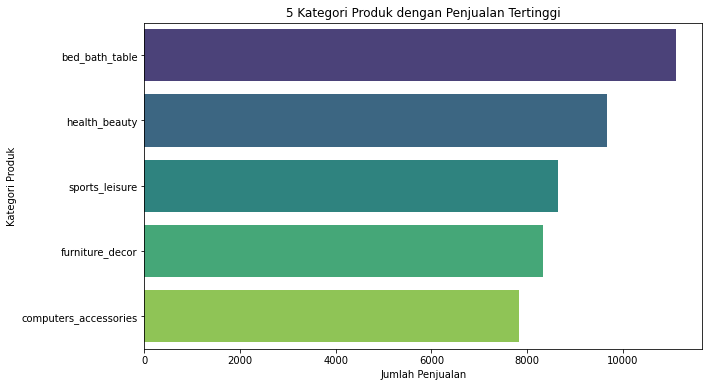

In [270]:
# Menggabungkan data items dan produk dengan kategori
items_products = pd.merge(data_order_items, data_products, on="product_id")
items_products_category = pd.merge(items_products, data_product_category_name_translation, on="product_category_name")

# Menghitung penjualan per kategori untuk semua kategori
all_category_sales = items_products_category['product_category_name_english'].value_counts()

# Mengambil 5 kategori dengan jumlah penjualan tertinggi
top_category_sales = all_category_sales.nlargest(5)

# Menampilkan 5 kategori tertinggi
print("5 Kategori dengan Penjualan Tertinggi:")
print(top_category_sales)

# Plot bar chart untuk 5 kategori tertinggi
plt.figure(figsize=(10, 6))
sns.barplot(x=top_category_sales.values, y=top_category_sales.index, palette="viridis")
plt.title("5 Kategori Produk dengan Penjualan Tertinggi")
plt.xlabel("Jumlah Penjualan")
plt.ylabel("Kategori Produk")
plt.show()




### Pertanyaan 2: Bagaimana tren penjualan untuk kategori produk dengan penjualan terbanyak?

<Figure size 864x576 with 0 Axes>

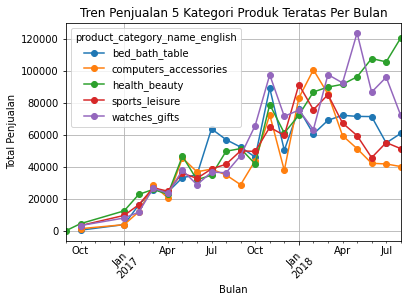

In [271]:
# Menggabungkan data order items dengan orders untuk mendapatkan data timestamp
orders_items = pd.merge(data_order_items, data_orders, on="order_id")

# Pastikan kolom 'order_purchase_timestamp' ada dan ubah ke format datetime
orders_items['order_purchase_timestamp'] = pd.to_datetime(orders_items['order_purchase_timestamp'])

# Tambahkan kolom bulan setelah kolom dikonversi ke datetime
orders_items['purchase_month'] = orders_items['order_purchase_timestamp'].dt.to_period('M')

# Menggabungkan dengan produk dan kategori
items_products_category = pd.merge(orders_items, data_products, on="product_id")
items_products_category = pd.merge(items_products_category, data_product_category_name_translation, on="product_category_name")

# Menghitung total penjualan per kategori
total_sales_per_category = items_products_category.groupby('product_category_name_english')['price'].sum()

# Mendapatkan 5 kategori produk teratas berdasarkan total penjualan
top_5_categories = total_sales_per_category.nlargest(5).index

# Memfilter hanya untuk 5 kategori teratas
filtered_items = items_products_category[items_products_category['product_category_name_english'].isin(top_5_categories)]

# Menghitung tren penjualan per kategori per bulan untuk 5 kategori teratas
monthly_sales_top_5 = filtered_items.groupby(['purchase_month', 'product_category_name_english'])['price'].sum().unstack()

# Plot line chart untuk tren penjualan 5 kategori teratas
plt.figure(figsize=(12,8))
monthly_sales_top_5.plot(marker='o')
plt.title("Tren Penjualan 5 Kategori Produk Teratas Per Bulan")
plt.xlabel("Bulan")
plt.ylabel("Total Penjualan")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


### Pertanyaan 3:  Kategori produk mana yang mendapatkan penjualan terendah?

5 Kategori dengan Penjualan Terendah:
arts_and_craftmanship        24
cds_dvds_musicals            14
la_cuisine                   14
fashion_childrens_clothes     8
security_and_services         2
Name: product_category_name_english, dtype: int64


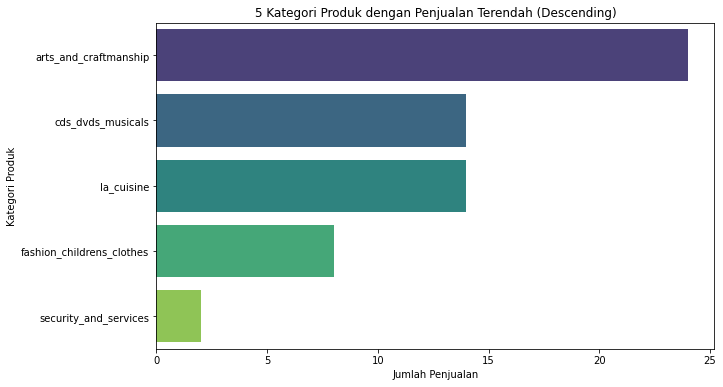

In [272]:
# Menghitung penjualan per kategori untuk semua kategori
all_category_sales = items_products_category['product_category_name_english'].value_counts()

# Mengambil 5 kategori dengan jumlah penjualan terendah dan mengurutkannya secara descending
lowest_category_sales = all_category_sales.nsmallest(5).sort_values(ascending=False)

# Menampilkan 5 kategori terendah
print("5 Kategori dengan Penjualan Terendah:")
print(lowest_category_sales)

# Plot bar chart untuk 5 kategori terendah
plt.figure(figsize=(10, 6))
sns.barplot(x=lowest_category_sales.values, y=lowest_category_sales.index, palette="viridis")
plt.title("5 Kategori Produk dengan Penjualan Terendah (Descending)")
plt.xlabel("Jumlah Penjualan")
plt.ylabel("Kategori Produk")
plt.show()




### Pertanyaan 4:  Bagaimana rata-rata tren penjualan produk secara keseluruhan?

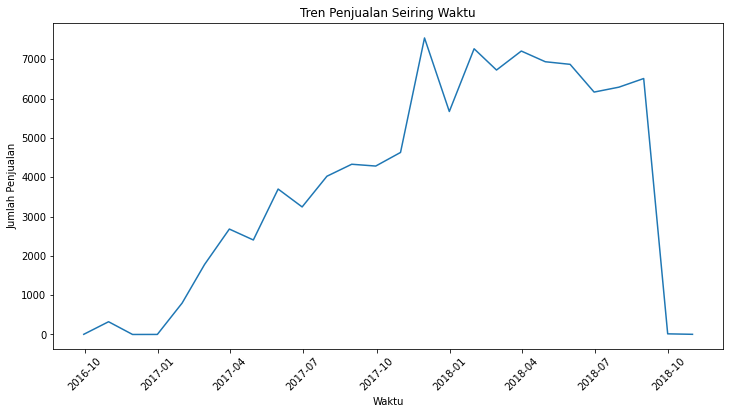

In [273]:
# Analisis Tren Penjualan 
data_orders['order_purchase_timestamp'] = pd.to_datetime(data_orders['order_purchase_timestamp'])
sales_trend = data_orders.resample('M', on='order_purchase_timestamp').size()

plt.figure(figsize=(12, 6))
sns.lineplot(data=sales_trend)
plt.title('Tren Penjualan Seiring Waktu')
plt.xlabel('Waktu')
plt.ylabel('Jumlah Penjualan')
plt.xticks(rotation=45)
plt.show()

### Pertanyaan 5:  Jenis pembayaran mana yang paling dominan digunakan oleh customers?

Persentase setiap jenis pembayaran:
credit_card    73.922376
boleto         19.043952
voucher         5.558978
debit_card      1.471806
not_defined     0.002888
Name: payment_type, dtype: float64


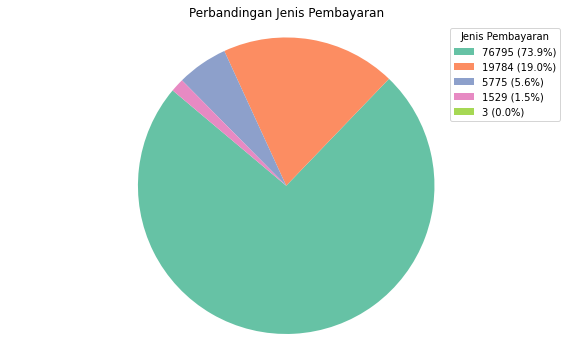

In [274]:
# Menghitung jumlah setiap jenis pembayaran
payment_counts = orders_payments['payment_type'].value_counts()

# Menampilkan persentase setiap jenis pembayaran
payment_percentage = (payment_counts / payment_counts.sum()) * 100
print("Persentase setiap jenis pembayaran:")
print(payment_percentage)

# Membuat pie chart 
plt.figure(figsize=(10, 6))
plt.pie(payment_counts, labels=None, startangle=140, colors=sns.color_palette("Set2"))

# Menambahkan legenda 
plt.legend(
    labels=[f'{count} ({percentage:.1f}%)' for count, percentage in zip(payment_counts, payment_percentage)],
    title="Jenis Pembayaran",
    loc="best"
)

plt.title("Perbandingan Jenis Pembayaran")
plt.axis('equal')  
plt.show()


### Pertanyaan 6 : Apa status pesanan yang paling umum dan bagaimana distribusi status pesanan tersebut?

Persentase setiap status pesanan:
delivered      97.822459
shipped         1.051931
canceled        0.481136
invoiced        0.318686
processing      0.316911
unavailable     0.006214
approved        0.002663
Name: order_status, dtype: float64


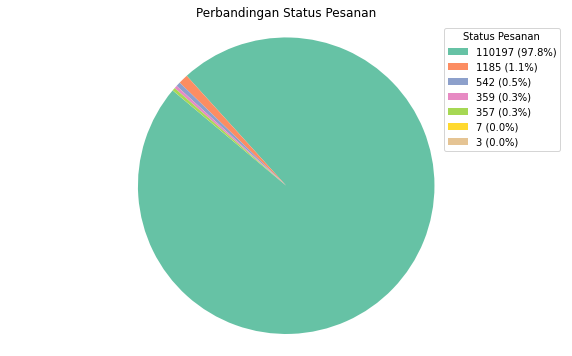

In [275]:
# Menghitung jumlah setiap status pesanan
order_status_counts = orders_items['order_status'].value_counts()

# Menampilkan persentase setiap status pesanan
order_status_percentage = (order_status_counts / order_status_counts.sum()) * 100
print("Persentase setiap status pesanan:")
print(order_status_percentage)

# Membuat pie chart
plt.figure(figsize=(10, 6))
plt.pie(order_status_counts, labels=None, startangle=140, colors=sns.color_palette("Set2"))

# Menambahkan legenda 
plt.legend(
    labels=[f'{count} ({percentage:.1f}%)' for count, percentage in zip(order_status_counts, order_status_percentage)],
    title="Status Pesanan",
    loc="best"
)

plt.title("Perbandingan Status Pesanan")
plt.axis('equal')  # Menjaga pie chart tetap bulat
plt.show()

### Pertanyaan 7 : Kota mana yang memiliki kontribusi terbesar terhadap jumlah pelanggan, dan bagaimana strategi pemasaran dapat disesuaikan untuk meningkatkan pangsa pasar di kota-kota lainnya?

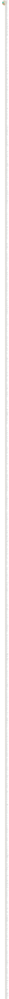

In [276]:
# Menghitung jumlah pelanggan per kota
customer_city_counts = data_customers['customer_city'].value_counts()

# Membuat pie chart
plt.figure(figsize=(10, 6))
plt.pie(customer_city_counts, startangle=140, colors=sns.color_palette("Set2"))

# Menambahkan legenda dengan persentase
plt.legend(
    labels=[f'{label}: {count} ({count / customer_city_counts.sum() * 100:.1f}%)' for label, count in zip(customer_city_counts.index, customer_city_counts)],
    title="Kota Pelanggan",
    loc="best"
)

plt.title("Distribusi Pelanggan Berdasarkan Kota")
plt.axis('equal')  
plt.show()



Jumlah pelanggan per kota:
sao paulo         15540
rio de janeiro     6882
belo horizonte     2773
brasilia           2131
curitiba           1521
lain-lain         70594
Name: customer_city, dtype: int64


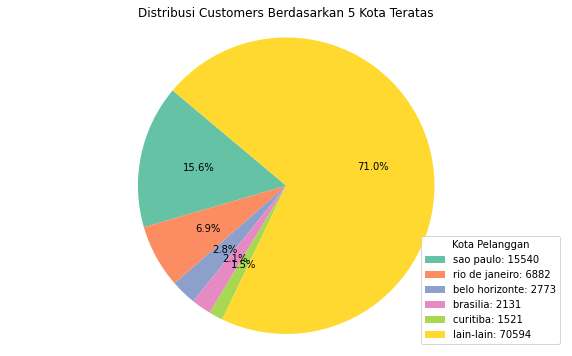

In [277]:
# Menghitung jumlah pelanggan per kota
customer_city_counts = data_customers['customer_city'].value_counts()

# Mengambil 5 kota teratas 
top_5_cities = customer_city_counts.head(5)
other_cities_count = customer_city_counts[5:].sum()  # Jumlah kota lainnya
top_5_cities['lain-lain'] = other_cities_count  # Menambahkan kategori 'kota lain'

# Menampilkan jumlah pelanggan per kota
print("Jumlah pelanggan per kota:")
print(top_5_cities)

# Membuat pie chart
plt.figure(figsize=(10, 6))
plt.pie(top_5_cities, startangle=140, colors=sns.color_palette("Set2"), autopct='%1.1f%%')

# Menambahkan legenda
plt.legend(
    labels=[f'{label}: {count}' for label, count in zip(top_5_cities.index, top_5_cities)],
    title="Kota Pelanggan",
    loc="best"
)

plt.title("Distribusi Customers Berdasarkan 5 Kota Teratas")
plt.axis('equal')  
plt.show()

### Pertanyaan 8 : Apa kategori produk dengan rating ulasan tertinggi dan terendah?

5 Produk dengan Rata-rata Skor Ulasan Tertinggi:
                         product_id  review_score  product_category_name
0  00066f42aeeb9f3007548bb9d3f33c38           5.0             perfumaria
1  000b8f95fcb9e0096488278317764d19           5.0  utilidades_domesticas
2  000d9be29b5207b54e86aa1b1ac54872           5.0     relogios_presentes
3  00126f27c813603687e6ce486d909d01           5.0             cool_stuff
4  001b237c0e9bb435f2e54071129237e9           5.0        cama_mesa_banho


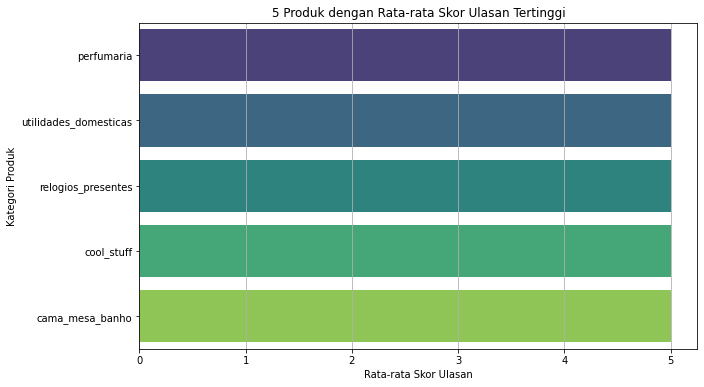

In [278]:
# Menggabungkan data Order Reviews dengan Order Items berdasarkan order_id
merged_reviews_items = pd.merge(data_order_reviews, data_order_items, on='order_id')

# Menggabungkan hasil dengan Data Products berdasarkan product_id
merged_all = pd.merge(merged_reviews_items, data_products, on='product_id')

# Menghitung rata-rata skor ulasan untuk setiap produk
average_review_scores = merged_all.groupby('product_id')['review_score'].mean().reset_index()

# Mengambil 5 produk dengan rata-rata skor ulasan tertinggi
top_5_average_scores = average_review_scores.nlargest(5, 'review_score')

# Menggabungkan dengan Data Products untuk mendapatkan nama kategori produk
top_5_average_scores = pd.merge(top_5_average_scores, data_products[['product_id', 'product_category_name']], on='product_id')

# Menampilkan hasil rata-rata skor
print("5 Produk dengan Rata-rata Skor Ulasan Tertinggi:")
print(top_5_average_scores[['product_id', 'review_score', 'product_category_name']])

# Mengatur ukuran plot
plt.figure(figsize=(10, 6))

# Membuat bar plot menggunakan product_category_name sebagai y-label
sns.barplot(data=top_5_average_scores, x='review_score', y='product_category_name', palette="viridis")

# Menambahkan judul dan label
plt.title("5 Produk dengan Rata-rata Skor Ulasan Tertinggi")
plt.xlabel("Rata-rata Skor Ulasan")
plt.ylabel("Kategori Produk")
plt.grid(axis='x')

# Menampilkan plot
plt.show()




5 Produk dengan Rata-rata Skor Ulasan Terendah:
                         product_id  review_score  \
0  0009406fd7479715e4bef61dd91f2462           1.0   
1  0011c512eb256aa0dbbb544d8dffcf6e           1.0   
2  002d4ea7c04739c130bb74d7e7cd1694           1.0   
3  0043c62d00db47eff6a6bc4cf6bfaeda           1.0   
4  0043d1a25ef08fb6f41b8fa6f91742ab           1.0   

               product_category_name  
0                    cama_mesa_banho  
1                         automotivo  
2                           pet_shop  
3                      esporte_lazer  
4  construcao_ferramentas_construcao  


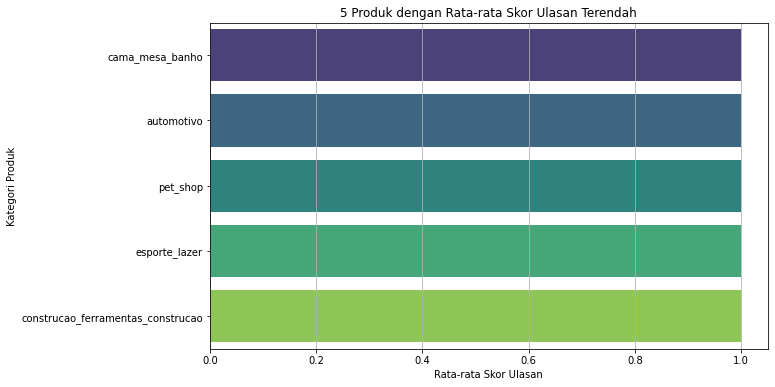

In [280]:
# Menggabungkan data Order Reviews dengan Order Items berdasarkan order_id
merged_reviews_items = pd.merge(data_order_reviews, data_order_items, on='order_id')

# Menggabungkan hasil dengan Data Products berdasarkan product_id
merged_all = pd.merge(merged_reviews_items, data_products, on='product_id')

# Menghitung rata-rata skor ulasan untuk setiap produk
average_review_scores = merged_all.groupby('product_id')['review_score'].mean().reset_index()

# Mengambil 5 produk dengan rata-rata skor ulasan terendah
bottom_5_average_scores = average_review_scores.nsmallest(5, 'review_score')

# Menggabungkan dengan Data Products untuk mendapatkan nama kategori produk
bottom_5_average_scores = pd.merge(bottom_5_average_scores, data_products[['product_id', 'product_category_name']], on='product_id')

# Menampilkan hasil rata-rata skor
print("5 Produk dengan Rata-rata Skor Ulasan Terendah:")
print(bottom_5_average_scores[['product_id', 'review_score', 'product_category_name']])

# Mengatur ukuran plot
plt.figure(figsize=(10, 6))

# Membuat bar plot menggunakan product_category_name sebagai y-label
sns.barplot(data=bottom_5_average_scores, x='review_score', y='product_category_name', palette="viridis")

# Menambahkan judul dan label
plt.title("5 Produk dengan Rata-rata Skor Ulasan Terendah")
plt.xlabel("Rata-rata Skor Ulasan")
plt.ylabel("Kategori Produk")
plt.grid(axis='x')

# Menampilkan plot
plt.show()



### Pertanyaan 9 : Apakah ada korelasi antara nilai review ulasan dan biaya pengiriman?

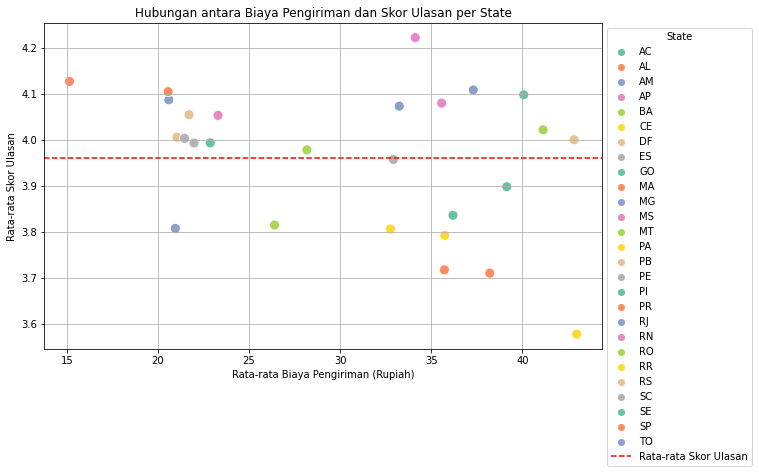

In [281]:
# Menggabungkan data order items dengan orders dan customers
orders_items_customers = pd.merge(data_order_items, data_orders, on="order_id")
orders_items_customers_geo = pd.merge(orders_items_customers, data_customers, on="customer_id")

# Menggabungkan data ulasan (reviews) untuk mendapatkan review score
orders_items_customers_reviews = pd.merge(orders_items_customers_geo, data_order_reviews, on="order_id")

# Menghitung rata-rata biaya pengiriman per state
shipping_cost_by_state = orders_items_customers_reviews.groupby('customer_state')['freight_value'].mean().reset_index()

# Menghitung rata-rata skor ulasan per state
average_review_by_state = orders_items_customers_reviews.groupby('customer_state')['review_score'].mean().reset_index()

# Menggabungkan data biaya pengiriman dan rata-rata skor ulasan
state_analysis = pd.merge(shipping_cost_by_state, average_review_by_state, on="customer_state")
state_analysis.columns = ['customer_state', 'freight_value_shipping', 'review_score']

# Plot scatter plot untuk menunjukkan hubungan antara biaya pengiriman dan skor ulasan
# Plot scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=state_analysis, x='freight_value_shipping', y='review_score', hue='customer_state', palette="Set2", s=100)

plt.title("Hubungan antara Biaya Pengiriman dan Skor Ulasan per State")
plt.xlabel("Rata-rata Biaya Pengiriman (Rupiah)")
plt.ylabel("Rata-rata Skor Ulasan")

# Menambahkan garis rata-rata skor ulasan
plt.axhline(y=state_analysis['review_score'].mean(), color='r', linestyle='--', label='Rata-rata Skor Ulasan')

# Menempatkan legend
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), title='State')  # Mengubah posisi legend
plt.grid(True)
plt.show()





C:\Users\hp\AppData\Local\Temp\ipykernel_31108\2094696609.py:21: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  heatmap_data = state_analysis.pivot("customer_state", "freight_value_shipping", "review_score")


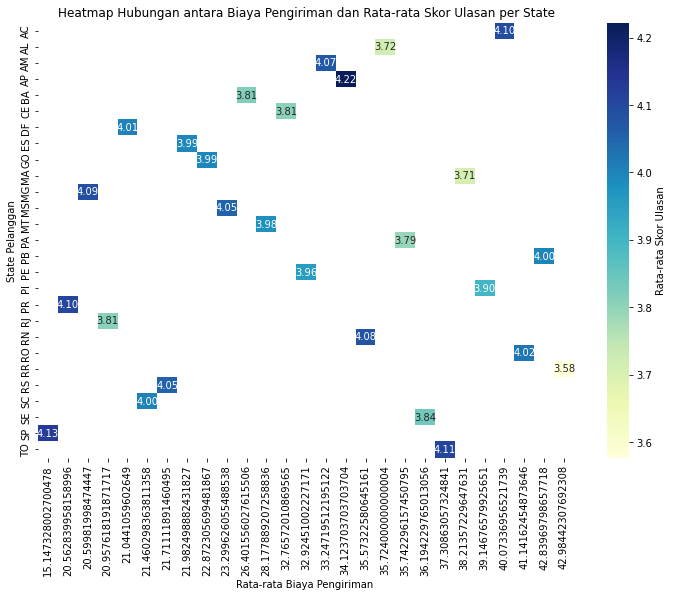

In [282]:
# Menggabungkan data order items dengan orders dan customers
orders_items_customers = pd.merge(data_order_items, data_orders, on="order_id")
orders_items_customers_geo = pd.merge(orders_items_customers, data_customers, on="customer_id")

# Menggabungkan data ulasan (reviews) untuk mendapatkan review score
orders_items_customers_reviews = pd.merge(orders_items_customers_geo, data_order_reviews, on="order_id")

# Menghitung rata-rata biaya pengiriman per state
shipping_cost_by_state = orders_items_customers_reviews.groupby('customer_state')['freight_value'].mean().reset_index()

# Menghitung rata-rata skor review per state
average_review_by_state = orders_items_customers_reviews.groupby('customer_state')['review_score'].mean().reset_index()

# Menggabungkan data biaya pengiriman dan rata-rata skor review
state_analysis = pd.merge(shipping_cost_by_state, average_review_by_state, on="customer_state")

# Pastikan nama kolom sesuai setelah penggabungan
state_analysis.columns = ['customer_state', 'freight_value_shipping', 'review_score']

# Membuat matriks untuk heatmap
heatmap_data = state_analysis.pivot("customer_state", "freight_value_shipping", "review_score")

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, annot=True, cmap="YlGnBu", fmt=".2f", cbar_kws={'label': 'Rata-rata Skor Ulasan'})
plt.title("Heatmap Hubungan antara Biaya Pengiriman dan Rata-rata Skor Ulasan per State")
plt.xlabel("Rata-rata Biaya Pengiriman ")
plt.ylabel("State Pelanggan")
plt.show()


In [283]:
# Menghitung nilai korelasi antara 'freight_value_shipping' dan 'review_score'
correlation = state_analysis['freight_value_shipping'].corr(state_analysis['review_score'])

# Mencetak nilai korelasi
print(f"Nilai Korelasi antara Biaya Pengiriman dan Skor Ulasan: {correlation:.2f}")


Nilai Korelasi antara Biaya Pengiriman dan Skor Ulasan: -0.34


**Insight:**
- Pertanyaan 1: Kategori produk mana yang mendorong penjualan terbanyak? Kategori bed_bath_table memimpin penjualan, diikuti health_beauty, sports_leisure, furniture_decor, dan computers_accessories, mencerminkan tren konsumen yang berfokus pada kenyamanan rumah, kesehatan, hiburan, dan teknologi.
- Pertanyaan 2: Bagaimana tren penjualan untuk kategori produk dengan penjualan terbanyak? Semua produk mengalami peningkatan penjualan selama Janiari 2017 - 2018 namun fluktuatif dari Januari 2018 - Juli 2018
- Pertanyaan 3:  Kategori produk mana yang mendapatkan penjualan terendah? Kategori dengan penjualan terendah adalah security_and_services (2 penjualan), diikuti oleh fashion_childrens_clothes (8 penjualan), la_cuisine dan cds_dvds_musicals (masing-masing 14 penjualan), serta arts_and_craftmanship (24 penjualan), menunjukkan bahwa produk terkait keamanan, pakaian anak, dan media fisik memiliki permintaan yang sangat rendah.
- Pertanyaan 4:  Bagaimana rata-rata tren penjualan produk keseluruhan? tren penjualan secara keseluruhan juga mengalami peningkatan antara selama Januari 2017 - 2018 namun fluktuatif dimulai pada tahun 2018.
- Pertanyaan 5:  Jenis pembayaran mana yang paling dominan digunakan oleh customers?Jenis pembayaran yang paling dominan digunakan oleh pelanggan adalah credit card dengan persentase 73,92%, menunjukkan bahwa sebagian besar customer lebih memilih kartu kredit sebagai metode pembayaran utama mereka.
- Pertanyaan 6 : Apa status pesanan yang paling umum dan bagaimana distribusi status pesanan tersebut?Status pesanan yang paling umum adalah delivered dengan persentase 97,82%, menunjukkan bahwa hampir semua pesanan berhasil dikirim, sementara status lainnya seperti shipped (1,05%) dan canceled (0,48%) memiliki distribusi yang jauh lebih rendah.
- Pertanyaan 7 : Kota mana yang memiliki kontribusi terbesar terhadap jumlah pelanggan, dan bagaimana strategi pemasaran dapat disesuaikan untuk meningkatkan pangsa pasar di kota-kota lainnya? Kota Sao Paulo memiliki kontribusi terbesar terhadap jumlah pelanggan dengan 15.540 pelanggan, diikuti oleh Rio de Janeiro (6.882) dan Belo Horizonte (2.773). Strategi pemasaran dapat difokuskan pada kota-kota dengan kontribusi lebih kecil, seperti Curitiba dan Brasilia, melalui kampanye misalnnya penawaran khusus yang dapat menaring customer.
- Pertanyaan 8 : Apa kategori produk dengan rating ulasan tertinggi dan terendah?Kategori produk dengan rating ulasan tertinggi adalah perfumaria, utilidades_domesticas, relogios_presentes, cool_stuff, dan cama_mesa_banho, semuanya dengan skor ulasan sempurna 5.0. sSementara Kategori produk dengan rating ulasan terendah adalah cama_mesa_banho, automotivo, pet_shop, esporte_lazer, dan construcao_ferramentas_construcao, semuanya dengan skor ulasan 1.0.
- Pertanyaan 9 : Apakah ada korelasi antara nilai review ulasan dan biaya pengiriman? Nilai korelasi -0.34 antara biaya pengiriman dan skor review menunjukkan hubungan negatif yang lemah, artinya semakin tinggi biaya pengiriman, cenderung ada sedikit penurunan dalam skor review, meskipun hubungan ini tidak terlalu kuat.

**English:**
- Question 1: Which product category drives the most sales? The bed_bath_table category leads sales, followed by health_beauty, sports_leisure, furniture_decor, and computers_accessories, reflecting consumer trends focused on home comfort, health, entertainment, and technology.
- Question 2: What are the sales trends for the top-selling product categories? All products experienced an increase in sales from January 2017 to 2018, but sales fluctuated from January 2018 to July 2018.
- Question 3: Which product category has the lowest sales? The category with the lowest sales is security_and_services (2 sales), followed by fashion_childrens_clothes (8 sales), la_cuisine and cds_dvds_musicals (14 sales each), and arts_and_craftmanship (24 sales), indicating that products related to security, children's clothing, and physical media have very low demand.
- Question 4: What is the overall product sales trend? Overall, product sales showed an increase from January 2017 to 2018, but sales became more volatile starting in 2018.
- Question 5: What is the most dominant payment method used by customers? The most dominant payment method used by customers is credit card, with a percentage of 73.92%, indicating that most customers prefer credit cards as their primary payment method.
- Question 6: What is the most common order status, and what is the distribution of order statuses? The most common order status is delivered, accounting for 97.82% of orders, indicating that almost all orders were successfully delivered, while other statuses such as shipped (1.05%) and canceled (0.48%) have much lower distributions.
- Question 7: Which city contributes the most to the customer base, and how can marketing strategies be adjusted to increase market share in other cities? The city of Sao Paulo contributes the most to the customer base with 15,540 customers, followed by Rio de Janeiro (6,882) and Belo Horizonte (2,773). Marketing strategies could focus on smaller contributing cities, such as Curitiba and Brasilia, through targeted promotions or special offers to attract more customers.
- Question 8: Which product category has the highest and lowest review ratings? The product categories with the highest review ratings are perfumaria, utilidades_domesticas, relogios_presentes, cool_stuff, and cama_mesa_banho, all with a perfect 5.0 score. Meanwhile, the categories with the lowest review ratings are cama_mesa_banho, automotivo, pet_shop, esporte_lazer, and construcao_ferramentas_construcao, all with a review score of 1.0.
- Question 9: Is there a correlation between review scores and shipping costs? The correlation value of -0.34 between shipping costs and review scores indicates a weak negative relationship, meaning that as shipping costs increase, there is a slight tendency for review scores to decrease, though the relationship is not particularly strong.


## Analisis Lanjutan (Opsional)

### Pertanyaan 10 : Di kota mana konsentrasi seller paling tinggi?

<Figure size 1152x864 with 0 Axes>

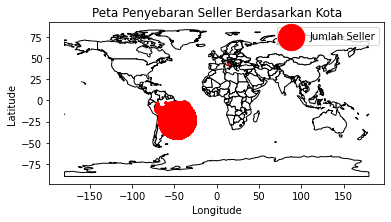

In [284]:
# Membaca data geolokasi
data_geolocations = pd.read_csv('geolocation_dataset.csv')

# Menghitung jumlah seller per kota
seller_city_counts = data_sellers['seller_city'].value_counts().reset_index()
seller_city_counts.columns = ['seller_city', 'count']

# Menggabungkan data geolokasi dengan jumlah seller
merged_data = pd.merge(data_geolocations, seller_city_counts, left_on='geolocation_city', right_on='seller_city', how='left')

# Mengubah DataFrame menjadi GeoDataFrame
gdf = gpd.GeoDataFrame(merged_data, geometry=gpd.points_from_xy(merged_data['geolocation_lng'], merged_data['geolocation_lat']))

# Mengatur ukuran plot 
plt.figure(figsize=(16, 12))  

# Mengambil data peta dunia dari file shapefile 
world = gpd.read_file('C:/Users/hp/ne_110m_admin_0_countries.shp')

# Membuat plot
ax = world.plot(color='white', edgecolor='black')

# Menambahkan titik lokasi seller ke peta
gdf.plot(ax=ax, marker='o', color='red', markersize=gdf['count'].fillna(0) * 2, label='Jumlah Seller')  # Ukuran titik diperkecil lebih lanjut

# Menambahkan label
plt.title('Peta Penyebaran Seller Berdasarkan Kota')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.show()



- Pertanyaan 10 : Di kota mana konsentrasi seller paling tinggi? Berdasarkan pada peta yang ditunjukkan, konsentrasi seller tertinggi ada pada Negara Brazil, Russia dan Spanyol.

## Conclusion

- Kategori produk yang mendorong penjualan terbanyak: Kategori bed_bath_table memimpin penjualan, menunjukkan konsumen lebih memilih produk untuk kenyamanan rumah.

- Tren penjualan kategori produk terlaris: Penjualan meningkat secara umum dari Januari 2017 hingga 2018, tetapi mengalami fluktuasi yang signifikan di tahun 2018.

- Kategori produk dengan penjualan terendah: Security_and_services memiliki penjualan sangat rendah (2 penjualan), menunjukkan rendahnya permintaan untuk kategori tersebut.

- Rata-rata tren penjualan keseluruhan: Tren penjualan keseluruhan menunjukkan peningkatan antara Januari 2017 dan 2018, tetapi juga fluktuatif di tahun 2018.

- Jenis pembayaran dominan: Metode pembayaran paling umum adalah kartu kredit (73,92%), menunjukkan preferensi pelanggan terhadap pembayaran yang cepat dan aman.

- Status pesanan yang umum: Status delivered mendominasi (97,82%), menunjukkan efektivitas pengiriman pesanan, sementara status lain seperti shipped dan canceled relatif rendah.

- Kota dengan kontribusi pelanggan terbanyak: Sao Paulo adalah kota dengan jumlah pelanggan terbanyak; strategi pemasaran perlu difokuskan pada kota-kota lain dengan kontribusi lebih rendah untuk meningkatkan pangsa pasar.

- Kategori produk dengan rating ulasan tertinggi dan terendah: Kategori dengan rating tertinggi adalah perfumaria dan sejenisnya (skor 5.0), sementara kategori dengan rating terendah termasuk automotivo (skor 1.0), menandakan perbedaan besar dalam kepuasan pelanggan.

- Korelasi antara skor ulasan dan biaya pengiriman: Terdapat korelasi negatif yang lemah (-0.34) antara biaya pengiriman dan skor ulasan, menunjukkan bahwa biaya pengiriman yang lebih tinggi cenderung dikaitkan dengan skor ulasan yang lebih rendah, meskipun tidak signifikan.

- Berdasarkan pada peta yang ditunjukkan, konsentrasi seller tertinggi ada pada Negara Brazil, Russia dan Spanyol.

Note: you may need to restart the kernel to use updated packages.


ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'requirements.txt'
